<a href="https://colab.research.google.com/github/srt3000/CE888/blob/main/Assignment2/Train_YoloV3_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Check if NVIDIA GPU is enabled
!nvidia-smi


Thu Apr 29 09:21:02 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P8    11W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

**Connect google drive**

In [6]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive


Mounted at /content/gdrive




```
# This is formatted as code
```

**1) Clone the Darknet repository**



In [7]:
!git clone https://github.com/AlexeyAB/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 14997, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 14997 (delta 18), reused 26 (delta 8), pack-reused 14951
Receiving objects: 100% (14997/14997), 13.41 MiB | 24.75 MiB/s, done.
Resolving deltas: 100% (10183/10183), done.


**2) Compile Darknet using Nvidia GPU**


In [8]:
# change makefile to have GPU and OPENCV enabled
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!make

/content/darknet
mkdir -p ./obj/
mkdir -p backup
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:926:23: warning: variable ‘rgb’ set but not used [-Wunused-but-set-variable]
                 float rgb[3];
                       ^~~
./src/image_opencv.cpp: In function ‘void draw_train_loss(char*, void**, int, float, float, int, int, float, int, char*, float, int, int, double)’:
./src/image_opencv.cpp:1127:13: warning: this ‘if’ clause does not guard... [-Wmisleading-indentation]
             if (iteration_old == 0)
           

**3) Configure Darknet network for training YOLO V3**

In [9]:
!cp cfg/yolov3.cfg cfg/yolov3_training.cfg

In [10]:
!sed -i 's/batch=1/batch=64/' cfg/yolov3_training.cfg
!sed -i 's/subdivisions=1/subdivisions=16/' cfg/yolov3_training.cfg
!sed -i 's/max_batches = 500200/max_batches = 4000/' cfg/yolov3_training.cfg
!sed -i '610 s@classes=80@classes=1@' cfg/yolov3_training.cfg
!sed -i '696 s@classes=80@classes=1@' cfg/yolov3_training.cfg
!sed -i '783 s@classes=80@classes=1@' cfg/yolov3_training.cfg
!sed -i '603 s@filters=255@filters=18@' cfg/yolov3_training.cfg
!sed -i '689 s@filters=255@filters=18@' cfg/yolov3_training.cfg
!sed -i '776 s@filters=255@filters=18@' cfg/yolov3_training.cfg

In [11]:
# Create folder on google drive so that we can save there the weights
!mkdir "/mydrive/yolov3"

mkdir: cannot create directory ‘/mydrive/yolov3’: File exists


In [12]:
!echo "Fire" > data/obj.names
!echo -e 'classes= 1\ntrain  = data/train.txt\nvalid  = data/test.txt\nnames = data/obj.names\nbackup = /mydrive/yolov3' > data/obj.data
!mkdir data/obj

In [ ]:
# Download weights darknet model 53
!wget https://pjreddie.com/media/files/darknet53.conv.74

**4) Extract Images**

The images need to be inside a zip archive called "images.zip" and they need to be inside the folder "yolov3" on Google Drive

In [13]:
!unzip /content/gdrive/MyDrive/yolov3/images.zip -d data/obj


Archive:  /content/gdrive/MyDrive/yolov3/images.zip
  inflating: data/obj/classes.txt    
  inflating: data/obj/resized_frame0.jpg  
  inflating: data/obj/resized_frame0.txt  
  inflating: data/obj/resized_frame10.jpg  
  inflating: data/obj/resized_frame10.txt  
  inflating: data/obj/resized_frame10000.jpg  
  inflating: data/obj/resized_frame10000.txt  
  inflating: data/obj/resized_frame1001.jpg  
  inflating: data/obj/resized_frame1001.txt  
  inflating: data/obj/resized_frame1218.jpg  
  inflating: data/obj/resized_frame1218.txt  
  inflating: data/obj/resized_frame19587.jpg  
  inflating: data/obj/resized_frame19587.txt  
  inflating: data/obj/resized_frame19588.jpg  
  inflating: data/obj/resized_frame19588.txt  
  inflating: data/obj/resized_frame2025.jpg  
  inflating: data/obj/resized_frame2025.txt  
  inflating: data/obj/resized_frame20334.jpg  
  inflating: data/obj/resized_frame20334.txt  
  inflating: data/obj/resized_frame2111.jpg  
 extracting: data/obj/resized_frame211

In [14]:
# We're going to convert the class index on the .txt files. As we're working with only one class, it's supposed to be class 0.
# If the index is different from 0 then we're going to change it.
import glob
import os
import re

txt_file_paths = glob.glob(r"data/obj/*.txt")
for i, file_path in enumerate(txt_file_paths):
    # get image size
    with open(file_path, "r") as f_o:
        lines = f_o.readlines()

        text_converted = []
        for line in lines:
            print(line)
            numbers = re.findall("[0-9.]+", line)
            print(numbers)
            if numbers:

                # Define coordinates
                text = "{} {} {} {} {}".format(0, numbers[1], numbers[2], numbers[3], numbers[4])
                text_converted.append(text)
                print(i, file_path)
                print(text)
        # Write file
        with open(file_path, 'w') as fp:
            for item in text_converted:
                fp.writelines("%s\n" % item)

15 0.320866 0.946850 0.043307 0.066929

['15', '0.320866', '0.946850', '0.043307', '0.066929']
0 data/obj/resized_frame22826.txt
0 0.320866 0.946850 0.043307 0.066929
15 0.360236 0.165354 0.059055 0.062992

['15', '0.360236', '0.165354', '0.059055', '0.062992']
0 data/obj/resized_frame22826.txt
0 0.360236 0.165354 0.059055 0.062992
15 0.344488 0.820866 0.074803 0.082677

['15', '0.344488', '0.820866', '0.074803', '0.082677']
1 data/obj/resized_frame20334.txt
0 0.344488 0.820866 0.074803 0.082677
15 0.535433 0.519685 0.039370 0.047244

['15', '0.535433', '0.519685', '0.039370', '0.047244']
1 data/obj/resized_frame20334.txt
0 0.535433 0.519685 0.039370 0.047244
15 0.393701 0.527559 0.031496 0.055118

['15', '0.393701', '0.527559', '0.031496', '0.055118']
2 data/obj/resized_frame7245.txt
0 0.393701 0.527559 0.031496 0.055118
15 0.572835 0.484252 0.035433 0.055118

['15', '0.572835', '0.484252', '0.035433', '0.055118']
2 data/obj/resized_frame7245.txt
0 0.572835 0.484252 0.035433 0.055118


In [15]:
import glob
images_list = glob.glob("data/obj/*.jpg")
print(images_list)

['data/obj/resized_frame24205.jpg', 'data/obj/resized_frame22826.jpg', 'data/obj/resized_frame4132.jpg', 'data/obj/resized_frame2592.jpg', 'data/obj/resized_frame26274.jpg', 'data/obj/resized_frame5210.jpg', 'data/obj/resized_frame9998.jpg', 'data/obj/resized_frame4131.jpg', 'data/obj/resized_frame7245.jpg', 'data/obj/resized_frame22828.jpg', 'data/obj/resized_frame2111.jpg', 'data/obj/resized_frame27288.jpg', 'data/obj/resized_frame26265.jpg', 'data/obj/resized_frame9999.jpg', 'data/obj/resized_frame20334.jpg', 'data/obj/resized_frame2025.jpg', 'data/obj/resized_frame725.jpg', 'data/obj/resized_frame10000.jpg', 'data/obj/resized_frame26272.jpg', 'data/obj/resized_frame4134.jpg', 'data/obj/resized_frame19587.jpg', 'data/obj/resized_frame27285.jpg', 'data/obj/resized_frame27289.jpg', 'data/obj/resized_frame10.jpg', 'data/obj/resized_frame7246.jpg', 'data/obj/resized_frame19588.jpg', 'data/obj/resized_frame24206.jpg', 'data/obj/resized_frame0.jpg', 'data/obj/resized_frame6070.jpg', 'data

In [16]:
#Create training.txt file
file = open("data/train.txt", "w") 
file.write("\n".join(images_list)) 
file.close() 

**6) Start the training**

In [ ]:
# Start the training
!./darknet detector train data/obj.data cfg/yolov3_training.cfg darknet53.conv.74 -dont_show

 CUDA-version: 11000 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
yolov3_training
 0 : compute_capability = 750, cudnn_half = 0, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 4, batch = 64, time_steps = 1, train = 1 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Sho

0
Confidence  0.37486
Area of bounding box, ie. approx. area of solar panel 2842 pixels
0
Confidence  0.8620404
Area of bounding box, ie. approx. area of solar panel 952 pixels
0
Confidence  0.954804
Area of bounding box, ie. approx. area of solar panel 2318 pixels
0
Confidence  0.7965129
Area of bounding box, ie. approx. area of solar panel 4644 pixels
0
Confidence  0.6560397
Area of bounding box, ie. approx. area of solar panel 1740 pixels
[[2]
 [1]
 [3]
 [4]]


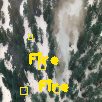

0
Confidence  0.92731696
Area of bounding box, ie. approx. area of solar panel 972 pixels
0
Confidence  0.86527455
Area of bounding box, ie. approx. area of solar panel 3740 pixels
0
Confidence  0.6277041
Area of bounding box, ie. approx. area of solar panel 3481 pixels
0
Confidence  0.70654684
Area of bounding box, ie. approx. area of solar panel 5772 pixels
[[0]
 [1]
 [3]
 [2]]


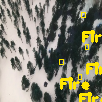

0
Confidence  0.3905687
Area of bounding box, ie. approx. area of solar panel 559 pixels
0
Confidence  0.45465362
Area of bounding box, ie. approx. area of solar panel 513 pixels
0
Confidence  0.42001662
Area of bounding box, ie. approx. area of solar panel 1305 pixels
0
Confidence  0.8055012
Area of bounding box, ie. approx. area of solar panel 2464 pixels
0
Confidence  0.6951884
Area of bounding box, ie. approx. area of solar panel 1900 pixels
0
Confidence  0.5957898
Area of bounding box, ie. approx. area of solar panel 4080 pixels
0
Confidence  0.867997
Area of bounding box, ie. approx. area of solar panel 3311 pixels
[[6]
 [3]
 [4]
 [5]]


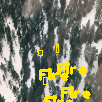

()


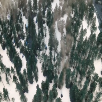

0
Confidence  0.99311745
Area of bounding box, ie. approx. area of solar panel 874 pixels
[[0]]


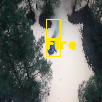

0
Confidence  0.51111114
Area of bounding box, ie. approx. area of solar panel 1920 pixels
[[0]]


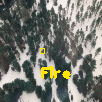

()


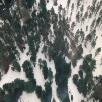

0
Confidence  0.8550498
Area of bounding box, ie. approx. area of solar panel 948 pixels
0
Confidence  0.73562247
Area of bounding box, ie. approx. area of solar panel 5698 pixels
[[0]
 [1]]


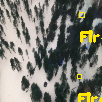

0
Confidence  0.4901373
Area of bounding box, ie. approx. area of solar panel 2542 pixels
()


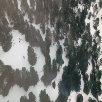

0
Confidence  0.9688075
Area of bounding box, ie. approx. area of solar panel 1950 pixels
0
Confidence  0.30205727
Area of bounding box, ie. approx. area of solar panel 1472 pixels
[[0]]


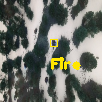

0
Confidence  0.99592406
Area of bounding box, ie. approx. area of solar panel 2058 pixels
[[0]]


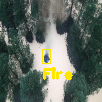

0
Confidence  0.3189946
Area of bounding box, ie. approx. area of solar panel 264 pixels
0
Confidence  0.8260189
Area of bounding box, ie. approx. area of solar panel 684 pixels
0
Confidence  0.3509245
Area of bounding box, ie. approx. area of solar panel 2666 pixels
0
Confidence  0.6411299
Area of bounding box, ie. approx. area of solar panel 2482 pixels
[[1]
 [3]]


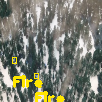

0
Confidence  0.368596
Area of bounding box, ie. approx. area of solar panel 559 pixels
0
Confidence  0.44312227
Area of bounding box, ie. approx. area of solar panel 513 pixels
0
Confidence  0.60583645
Area of bounding box, ie. approx. area of solar panel 1276 pixels
0
Confidence  0.8353404
Area of bounding box, ie. approx. area of solar panel 2420 pixels
0
Confidence  0.5526062
Area of bounding box, ie. approx. area of solar panel 1900 pixels
0
Confidence  0.64747083
Area of bounding box, ie. approx. area of solar panel 3960 pixels
0
Confidence  0.8390798
Area of bounding box, ie. approx. area of solar panel 3311 pixels
[[6]
 [3]
 [5]
 [2]
 [4]]


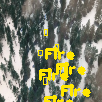

0
Confidence  0.5590765
Area of bounding box, ie. approx. area of solar panel 297 pixels
0
Confidence  0.72879314
Area of bounding box, ie. approx. area of solar panel 672 pixels
0
Confidence  0.72977793
Area of bounding box, ie. approx. area of solar panel 2666 pixels
[[2]
 [1]
 [0]]


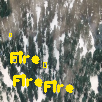

0
Confidence  0.39567003
Area of bounding box, ie. approx. area of solar panel 513 pixels
0
Confidence  0.6753035
Area of bounding box, ie. approx. area of solar panel 1276 pixels
0
Confidence  0.8174984
Area of bounding box, ie. approx. area of solar panel 2420 pixels
0
Confidence  0.6144829
Area of bounding box, ie. approx. area of solar panel 1900 pixels
0
Confidence  0.6514878
Area of bounding box, ie. approx. area of solar panel 3960 pixels
0
Confidence  0.8695701
Area of bounding box, ie. approx. area of solar panel 3311 pixels
[[5]
 [2]
 [1]
 [4]
 [3]]


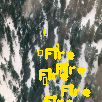

0
Confidence  0.9688719
Area of bounding box, ie. approx. area of solar panel 416 pixels
0
Confidence  0.8561044
Area of bounding box, ie. approx. area of solar panel 2790 pixels
[[0]
 [1]]


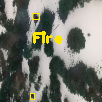

0
Confidence  0.30418834
Area of bounding box, ie. approx. area of solar panel 4800 pixels
0
Confidence  0.9647341
Area of bounding box, ie. approx. area of solar panel 2430 pixels
0
Confidence  0.7894696
Area of bounding box, ie. approx. area of solar panel 738 pixels
0
Confidence  0.92301434
Area of bounding box, ie. approx. area of solar panel 768 pixels
0
Confidence  0.587241
Area of bounding box, ie. approx. area of solar panel 800 pixels
0
Confidence  0.71796614
Area of bounding box, ie. approx. area of solar panel 1960 pixels
0
Confidence  0.93981624
Area of bounding box, ie. approx. area of solar panel 4800 pixels
[[1]
 [6]
 [3]
 [2]
 [5]
 [4]]


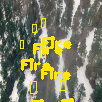

()


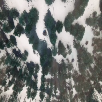

0
Confidence  0.31379667
Area of bounding box, ie. approx. area of solar panel 1920 pixels
()


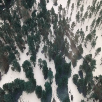

0
Confidence  0.41082782
Area of bounding box, ie. approx. area of solar panel 396 pixels
0
Confidence  0.9907767
Area of bounding box, ie. approx. area of solar panel 384 pixels
0
Confidence  0.8777837
Area of bounding box, ie. approx. area of solar panel 2790 pixels
[[1]
 [2]]


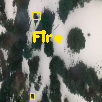

0
Confidence  0.96568567
Area of bounding box, ie. approx. area of solar panel 2596 pixels
0
Confidence  0.83866584
Area of bounding box, ie. approx. area of solar panel 2028 pixels
0
Confidence  0.47070935
Area of bounding box, ie. approx. area of solar panel 4050 pixels
0
Confidence  0.7759424
Area of bounding box, ie. approx. area of solar panel 1748 pixels
[[0]
 [1]
 [3]]


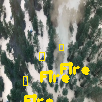

0
Confidence  0.7684232
Area of bounding box, ie. approx. area of solar panel 1066 pixels
0
Confidence  0.34903878
Area of bounding box, ie. approx. area of solar panel 2231 pixels
0
Confidence  0.74574244
Area of bounding box, ie. approx. area of solar panel 3910 pixels
0
Confidence  0.45356783
Area of bounding box, ie. approx. area of solar panel 3721 pixels
[[0]
 [2]]


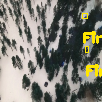

()


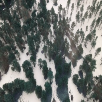

0
Confidence  0.9882004
Area of bounding box, ie. approx. area of solar panel 2867 pixels
[[0]]


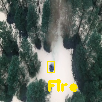

0
Confidence  0.996672
Area of bounding box, ie. approx. area of solar panel 2304 pixels
[[0]]


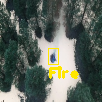

0
Confidence  0.993437
Area of bounding box, ie. approx. area of solar panel 1260 pixels
[[0]]


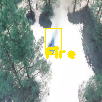

KeyboardInterrupt: ignored

In [ ]:
import cv2
import numpy as np
import glob
import random
from google.colab.patches import cv2_imshow
from IPython.display import Image
import IPython
import PIL.Image
# Load Yolo
net = cv2.dnn.readNet(r"/content/gdrive/MyDrive/yolov3/yolov3_training_2000.weights", r"/content/gdrive/MyDrive/yolov3/yolov3_testing.cfg")

# Name of the labelled object which is to be detected 
classes = ["Fire"]



# Images path
images_path = glob.glob(r"data/obj/*.jpg")


glob.glob("data/obj/*.jpg")


layer_names = net.getLayerNames()
output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
colors = np.random.uniform(0, 255, size=(len(classes), 3)) 


random.shuffle(images_path)

# loop through all the images
for img_path in images_path:
    # Loading image
    img = cv2.imread(img_path)
    img = cv2.resize(img, None, fx=0.4, fy=0.4)
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)

    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing informations on the screen
    class_ids = []
    confidences = []
    boxes = []
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.3:
                # Object detected
                print(class_id)
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)
                print("Confidence ", confidence)
                print("Area of bounding box, ie. approx. area of solar panel", x*y,"pixels")

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    print(indexes)
    font = cv2.FONT_HERSHEY_PLAIN
    # Blue color in BGR
    color = (255, 230, 0)
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            #color = colors[class_ids[i]]
            cv2.rectangle(img, (x, y), (x + w, y + h), color, 1)
            cv2.putText(img, label, (x, y + 30), font, 1, color, 2)
           
    
    IPython.display.display(PIL.Image.fromarray(img))

In [ ]:
import cv2

import numpy as np

import matplotlib.pyplot as plt

 
#images_list = glob.glob("data/obj/*.jpg")

 

lower_bound = np.array([11,33,111])

upper_bound = np.array([90,255,255])

 

for frame in images_list:



    frame = cv2.resize(frame,(1280,720))

    frame = cv2.flip(frame,1)

 

    frame_smooth = cv2.GaussianBlur(frame,(7,7),0)

 

    mask = np.zeros_like(frame)

   

    mask[0:720, 0:1280] = [255,255,255]

 

    img_roi = cv2.bitwise_and(frame_smooth, mask)

 

    frame_hsv = cv2.cvtColor(img_roi,cv2.COLOR_BGR2HSV)

 

    image_binary = cv2.inRange(frame_hsv, lower_bound, upper_bound)

 

    cv2.imshow("Fire Detection",image_binary)

 

    if cv2.waitKey(10) == 27 :

        break

 


cv2.destroyAllWindows() 

TypeError: ignored

0
Confidence  0.90584284
Area of bounding box, ie. approx. area of fire 3968 pixels
0
Confidence  0.9424886
Area of bounding box, ie. approx. area of fire 10437 pixels
0
Confidence  0.9935805
Area of bounding box, ie. approx. area of fire 20020 pixels
0
Confidence  0.99552083
Area of bounding box, ie. approx. area of fire 38305 pixels
0
Confidence  0.9150144
Area of bounding box, ie. approx. area of fire 35880 pixels
[[3]
 [2]
 [1]
 [4]
 [0]]


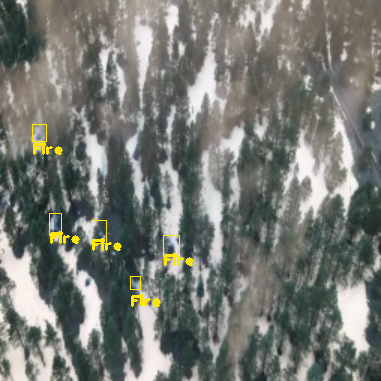

0
Confidence  0.9806871
Area of bounding box, ie. approx. area of fire 35190 pixels
0
Confidence  0.5409184
Area of bounding box, ie. approx. area of fire 5301 pixels
0
Confidence  0.49492946
Area of bounding box, ie. approx. area of fire 5841 pixels
0
Confidence  0.9810981
Area of bounding box, ie. approx. area of fire 11076 pixels
0
Confidence  0.9675135
Area of bounding box, ie. approx. area of fire 11011 pixels
0
Confidence  0.46660337
Area of bounding box, ie. approx. area of fire 6004 pixels
0
Confidence  0.70601684
Area of bounding box, ie. approx. area of fire 11935 pixels
0
Confidence  0.93678343
Area of bounding box, ie. approx. area of fire 28952 pixels
0
Confidence  0.87049395
Area of bounding box, ie. approx. area of fire 14124 pixels
0
Confidence  0.94476706
Area of bounding box, ie. approx. area of fire 69084 pixels
0
Confidence  0.30359083
Area of bounding box, ie. approx. area of fire 35728 pixels
[[3]
 [0]
 [4]
 [9]
 [7]
 [8]
 [6]
 [1]]


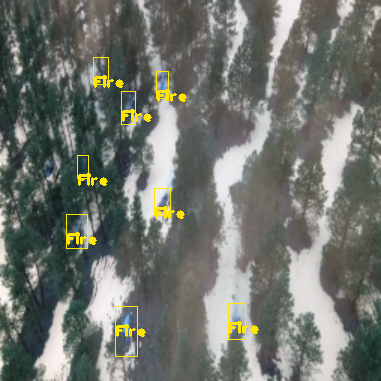

0
Confidence  0.9505967
Area of bounding box, ie. approx. area of fire 3906 pixels
0
Confidence  0.96721345
Area of bounding box, ie. approx. area of fire 10486 pixels
0
Confidence  0.9932634
Area of bounding box, ie. approx. area of fire 20202 pixels
0
Confidence  0.9935515
Area of bounding box, ie. approx. area of fire 38142 pixels
[[3]
 [2]
 [1]
 [0]]


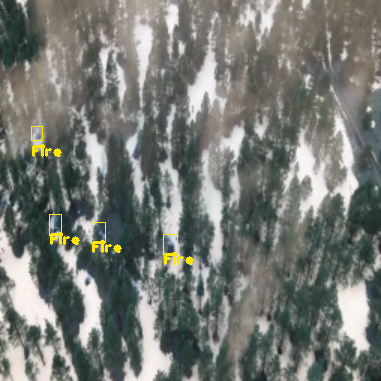

0
Confidence  0.98135334
Area of bounding box, ie. approx. area of fire 18240 pixels
[[0]]


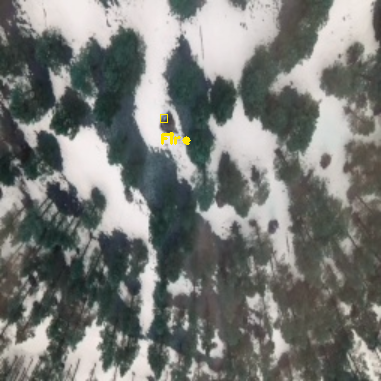

0
Confidence  0.8896345
Area of bounding box, ie. approx. area of fire 6223 pixels
0
Confidence  0.98549944
Area of bounding box, ie. approx. area of fire 39088 pixels
[[1]
 [0]]


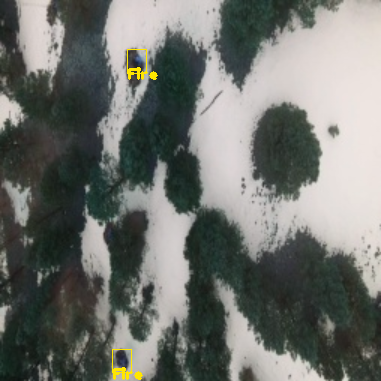

0
Confidence  0.9696504
Area of bounding box, ie. approx. area of fire 34263 pixels
0
Confidence  0.9927382
Area of bounding box, ie. approx. area of fire 26130 pixels
0
Confidence  0.9894099
Area of bounding box, ie. approx. area of fire 59565 pixels
0
Confidence  0.9883442
Area of bounding box, ie. approx. area of fire 8932 pixels
0
Confidence  0.8925935
Area of bounding box, ie. approx. area of fire 4070 pixels
[[1]
 [2]
 [3]
 [0]
 [4]]


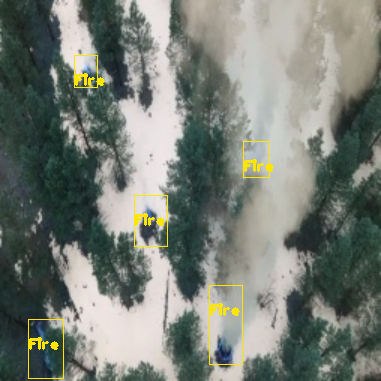

0
Confidence  0.65570545
Area of bounding box, ie. approx. area of fire 7920 pixels
0
Confidence  0.9371988
Area of bounding box, ie. approx. area of fire 7548 pixels
0
Confidence  0.6500391
Area of bounding box, ie. approx. area of fire 19320 pixels
0
Confidence  0.9806979
Area of bounding box, ie. approx. area of fire 36120 pixels
0
Confidence  0.9357519
Area of bounding box, ie. approx. area of fire 27027 pixels
0
Confidence  0.6686802
Area of bounding box, ie. approx. area of fire 28560 pixels
0
Confidence  0.7506847
Area of bounding box, ie. approx. area of fire 57825 pixels
0
Confidence  0.98113894
Area of bounding box, ie. approx. area of fire 46880 pixels
[[7]
 [3]
 [1]
 [4]
 [6]
 [5]
 [0]
 [2]]


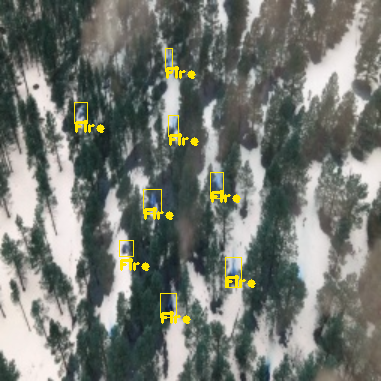

0
Confidence  0.69800067
Area of bounding box, ie. approx. area of fire 34336 pixels
0
Confidence  0.8560285
Area of bounding box, ie. approx. area of fire 37036 pixels
0
Confidence  0.94803727
Area of bounding box, ie. approx. area of fire 33335 pixels
[[2]
 [1]]


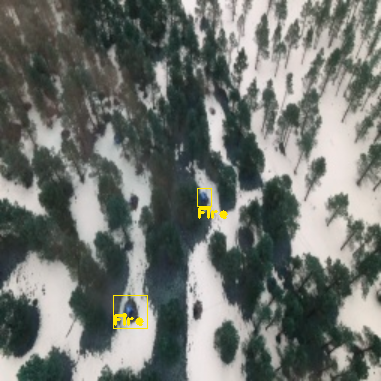

0
Confidence  0.982602
Area of bounding box, ie. approx. area of fire 18193 pixels
[[0]]


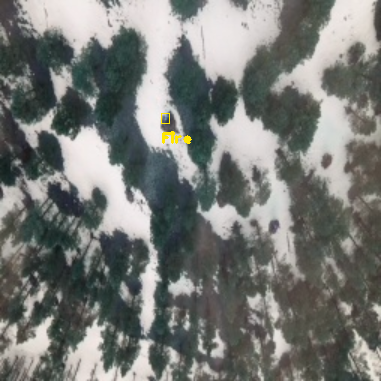

0
Confidence  0.84020317
Area of bounding box, ie. approx. area of fire 28336 pixels
[[0]]


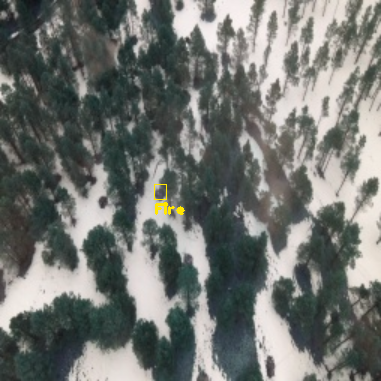

0
Confidence  0.9983449
Area of bounding box, ie. approx. area of fire 27676 pixels
0
Confidence  0.9625327
Area of bounding box, ie. approx. area of fire 20160 pixels
[[0]
 [1]]


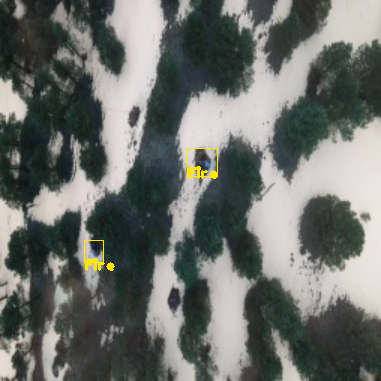

0
Confidence  0.99539196
Area of bounding box, ie. approx. area of fire 16830 pixels
[[0]]


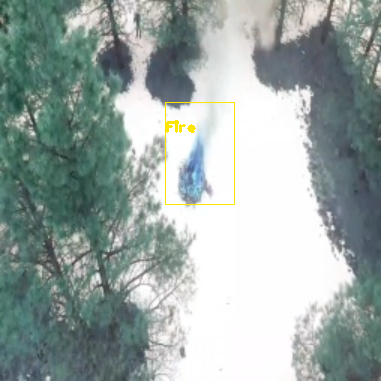

0
Confidence  0.94889075
Area of bounding box, ie. approx. area of fire 12857 pixels
0
Confidence  0.8260997
Area of bounding box, ie. approx. area of fire 50715 pixels
0
Confidence  0.86794317
Area of bounding box, ie. approx. area of fire 32037 pixels
0
Confidence  0.9799951
Area of bounding box, ie. approx. area of fire 49506 pixels
0
Confidence  0.9882308
Area of bounding box, ie. approx. area of fire 79443 pixels
[[4]
 [3]
 [0]
 [2]
 [1]]


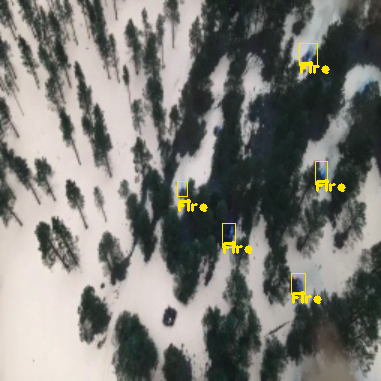

0
Confidence  0.9973295
Area of bounding box, ie. approx. area of fire 42224 pixels
[[0]]


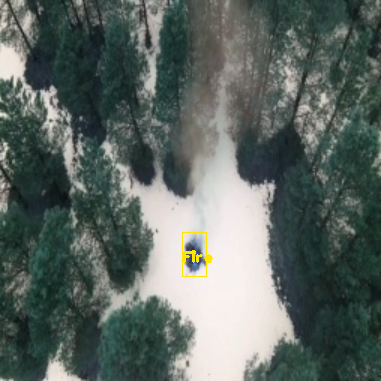

0
Confidence  0.99571836
Area of bounding box, ie. approx. area of fire 27930 pixels
0
Confidence  0.9610921
Area of bounding box, ie. approx. area of fire 19920 pixels
[[0]
 [1]]


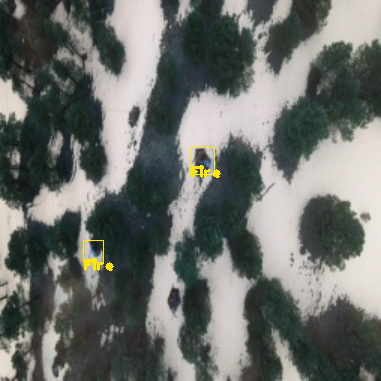

0
Confidence  0.9803126
Area of bounding box, ie. approx. area of fire 13938 pixels
0
Confidence  0.5188426
Area of bounding box, ie. approx. area of fire 30600 pixels
0
Confidence  0.8639705
Area of bounding box, ie. approx. area of fire 54249 pixels
0
Confidence  0.88467145
Area of bounding box, ie. approx. area of fire 32757 pixels
0
Confidence  0.991313
Area of bounding box, ie. approx. area of fire 50625 pixels
0
Confidence  0.66240734
Area of bounding box, ie. approx. area of fire 83176 pixels
[[4]
 [0]
 [3]
 [2]
 [5]
 [1]]


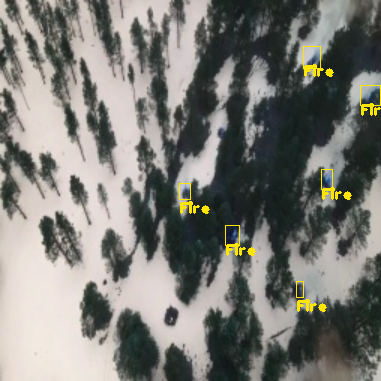

0
Confidence  0.9981252
Area of bounding box, ie. approx. area of fire 31140 pixels
[[0]]


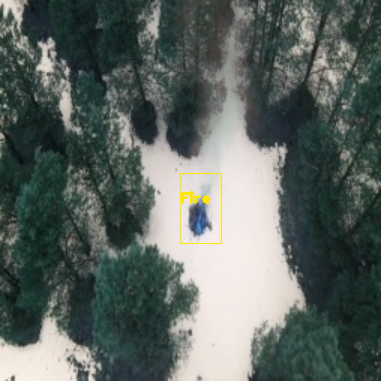

0
Confidence  0.9078729
Area of bounding box, ie. approx. area of fire 36504 pixels
0
Confidence  0.59856963
Area of bounding box, ie. approx. area of fire 88200 pixels
[[0]
 [1]]


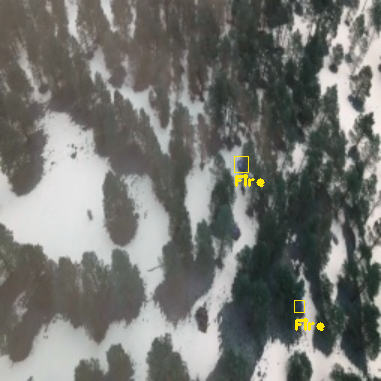

0
Confidence  0.9432452
Area of bounding box, ie. approx. area of fire 8827 pixels
0
Confidence  0.93889207
Area of bounding box, ie. approx. area of fire 7104 pixels
0
Confidence  0.70123005
Area of bounding box, ie. approx. area of fire 14535 pixels
0
Confidence  0.82407385
Area of bounding box, ie. approx. area of fire 28223 pixels
[[0]
 [1]
 [3]
 [2]]


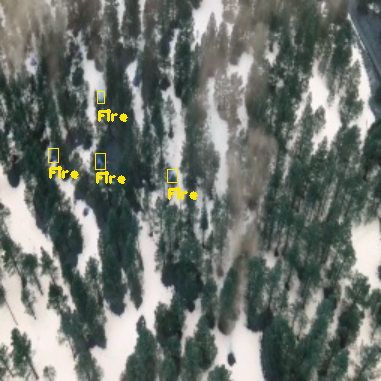

0
Confidence  0.7962782
Area of bounding box, ie. approx. area of fire 36270 pixels
[[0]]


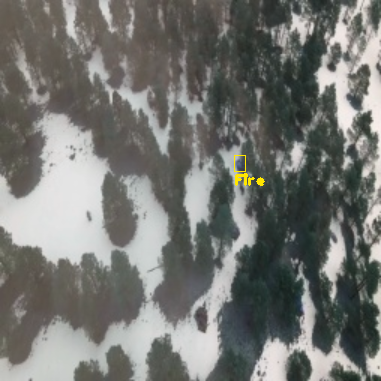

()


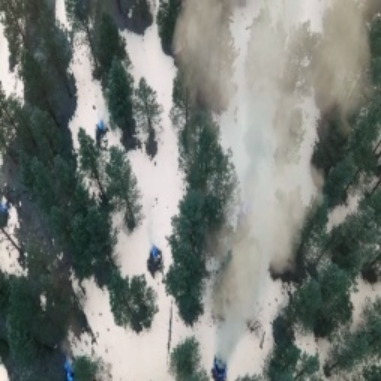

0
Confidence  0.98782223
Area of bounding box, ie. approx. area of fire 41664 pixels
0
Confidence  0.5747356
Area of bounding box, ie. approx. area of fire 26325 pixels
0
Confidence  0.99158126
Area of bounding box, ie. approx. area of fire 13910 pixels
0
Confidence  0.9778894
Area of bounding box, ie. approx. area of fire 33810 pixels
0
Confidence  0.9907715
Area of bounding box, ie. approx. area of fire 65688 pixels
0
Confidence  0.8525314
Area of bounding box, ie. approx. area of fire 26163 pixels
[[2]
 [4]
 [0]
 [3]
 [5]]


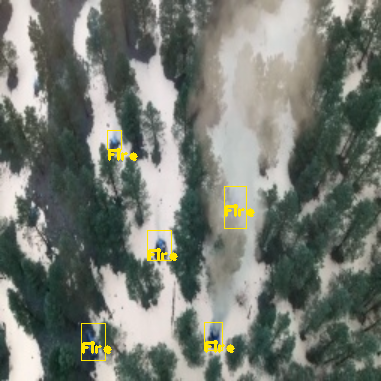

0
Confidence  0.6991181
Area of bounding box, ie. approx. area of fire 8250 pixels
0
Confidence  0.9003418
Area of bounding box, ie. approx. area of fire 7725 pixels
0
Confidence  0.9193192
Area of bounding box, ie. approx. area of fire 19266 pixels
0
Confidence  0.9346768
Area of bounding box, ie. approx. area of fire 35700 pixels
0
Confidence  0.83472276
Area of bounding box, ie. approx. area of fire 27072 pixels
0
Confidence  0.72152704
Area of bounding box, ie. approx. area of fire 28920 pixels
0
Confidence  0.88001245
Area of bounding box, ie. approx. area of fire 56296 pixels
0
Confidence  0.98928356
Area of bounding box, ie. approx. area of fire 47466 pixels
[[7]
 [3]
 [2]
 [1]
 [6]
 [4]
 [5]
 [0]]


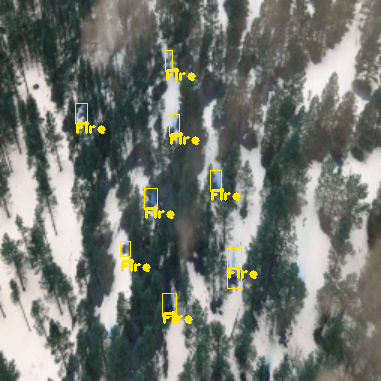

0
Confidence  0.9974324
Area of bounding box, ie. approx. area of fire 5978 pixels
0
Confidence  0.9884376
Area of bounding box, ie. approx. area of fire 38976 pixels
[[0]
 [1]]


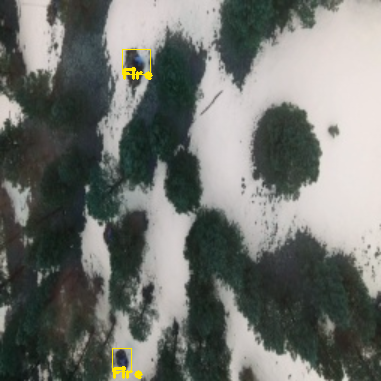

0
Confidence  0.9887139
Area of bounding box, ie. approx. area of fire 27784 pixels
[[0]]


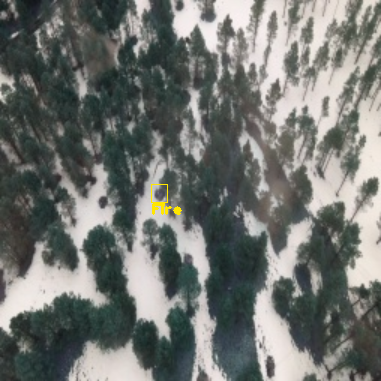

0
Confidence  0.9144521
Area of bounding box, ie. approx. area of fire 28490 pixels
[[0]]


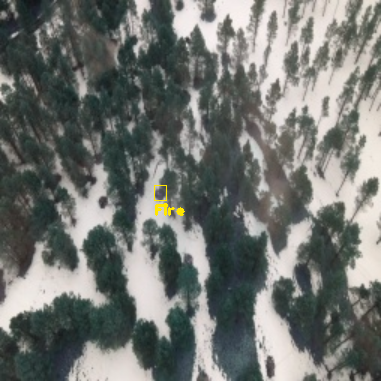

0
Confidence  0.80916786
Area of bounding box, ie. approx. area of fire 3906 pixels
0
Confidence  0.8900623
Area of bounding box, ie. approx. area of fire 10600 pixels
0
Confidence  0.9612846
Area of bounding box, ie. approx. area of fire 20332 pixels
0
Confidence  0.9451098
Area of bounding box, ie. approx. area of fire 38704 pixels
0
Confidence  0.638026
Area of bounding box, ie. approx. area of fire 36418 pixels
[[2]
 [3]
 [1]
 [0]
 [4]]


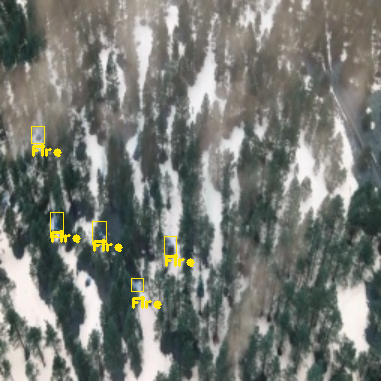

0
Confidence  0.99401623
Area of bounding box, ie. approx. area of fire 16324 pixels
0
Confidence  0.362881
Area of bounding box, ie. approx. area of fire 34404 pixels
0
Confidence  0.65039957
Area of bounding box, ie. approx. area of fire 56875 pixels
0
Confidence  0.95092684
Area of bounding box, ie. approx. area of fire 33856 pixels
0
Confidence  0.9486552
Area of bounding box, ie. approx. area of fire 52668 pixels
0
Confidence  0.9645383
Area of bounding box, ie. approx. area of fire 84656 pixels
[[0]
 [5]
 [3]
 [4]
 [2]]


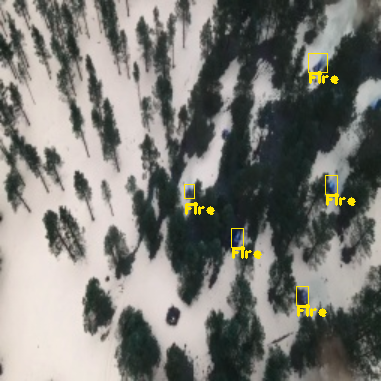

0
Confidence  0.613921
Area of bounding box, ie. approx. area of fire 8200 pixels
0
Confidence  0.91685987
Area of bounding box, ie. approx. area of fire 7725 pixels
0
Confidence  0.82421666
Area of bounding box, ie. approx. area of fire 19152 pixels
0
Confidence  0.91094136
Area of bounding box, ie. approx. area of fire 36292 pixels
0
Confidence  0.9327437
Area of bounding box, ie. approx. area of fire 27027 pixels
0
Confidence  0.7329472
Area of bounding box, ie. approx. area of fire 28679 pixels
0
Confidence  0.8297869
Area of bounding box, ie. approx. area of fire 57204 pixels
0
Confidence  0.9823559
Area of bounding box, ie. approx. area of fire 46720 pixels
[[7]
 [4]
 [1]
 [3]
 [6]
 [2]
 [5]
 [0]]


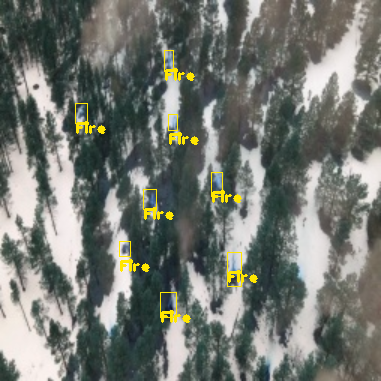

0
Confidence  0.3855234
Area of bounding box, ie. approx. area of fire 10266 pixels
0
Confidence  0.5768431
Area of bounding box, ie. approx. area of fire 13696 pixels
0
Confidence  0.31763428
Area of bounding box, ie. approx. area of fire 66825 pixels
0
Confidence  0.98984176
Area of bounding box, ie. approx. area of fire 34656 pixels
0
Confidence  0.9624515
Area of bounding box, ie. approx. area of fire 5187 pixels
0
Confidence  0.97058463
Area of bounding box, ie. approx. area of fire 10850 pixels
0
Confidence  0.76266223
Area of bounding box, ie. approx. area of fire 10502 pixels
0
Confidence  0.65844643
Area of bounding box, ie. approx. area of fire 5148 pixels
0
Confidence  0.9631481
Area of bounding box, ie. approx. area of fire 11552 pixels
0
Confidence  0.32229644
Area of bounding box, ie. approx. area of fire 27999 pixels
0
Confidence  0.95199794
Area of bounding box, ie. approx. area of fire 68856 pixels
[[ 3]
 [ 5]
 [ 8]
 [ 4]
 [10]
 [ 6]
 [ 7]
 [ 1]]


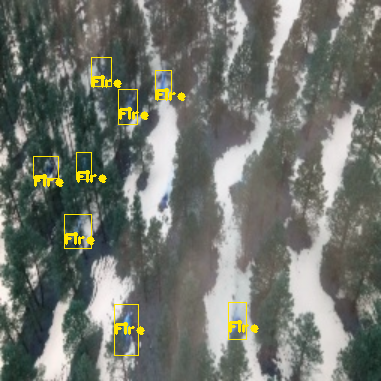

0
Confidence  0.9973539
Area of bounding box, ie. approx. area of fire 28161 pixels
0
Confidence  0.9561856
Area of bounding box, ie. approx. area of fire 19440 pixels
[[0]
 [1]]


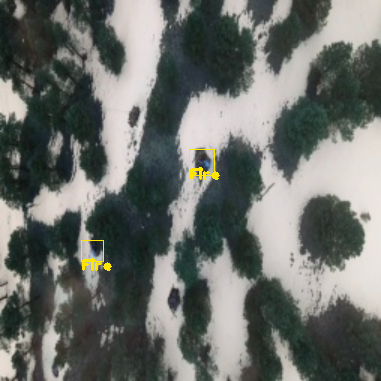

0
Confidence  0.92229223
Area of bounding box, ie. approx. area of fire 17760 pixels
[[0]]


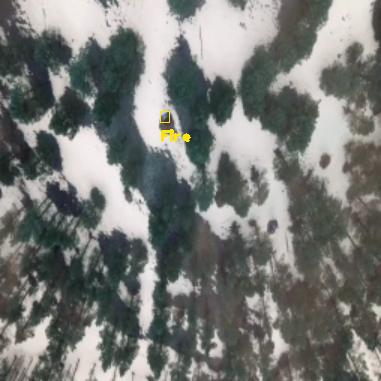

0
Confidence  0.99509585
Area of bounding box, ie. approx. area of fire 28800 pixels
[[0]]


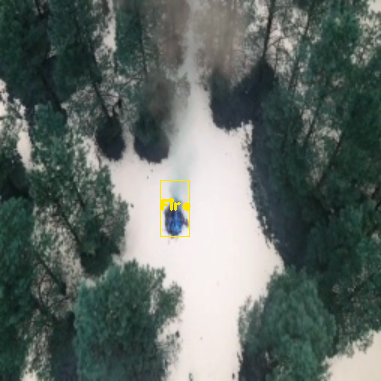

0
Confidence  0.9940357
Area of bounding box, ie. approx. area of fire 15912 pixels
0
Confidence  0.40891874
Area of bounding box, ie. approx. area of fire 31755 pixels
0
Confidence  0.82513946
Area of bounding box, ie. approx. area of fire 55062 pixels
0
Confidence  0.81797737
Area of bounding box, ie. approx. area of fire 33306 pixels
0
Confidence  0.6748965
Area of bounding box, ie. approx. area of fire 51302 pixels
0
Confidence  0.7502947
Area of bounding box, ie. approx. area of fire 82908 pixels
[[0]
 [2]
 [3]
 [5]
 [4]]


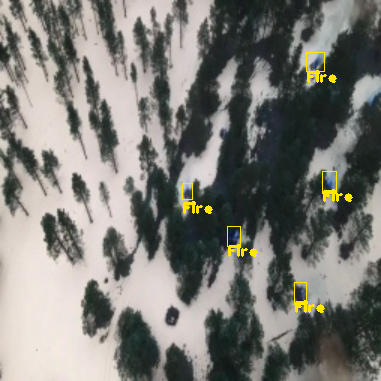

0
Confidence  0.95405424
Area of bounding box, ie. approx. area of fire 4455 pixels
0
Confidence  0.9079153
Area of bounding box, ie. approx. area of fire 10780 pixels
0
Confidence  0.997989
Area of bounding box, ie. approx. area of fire 21808 pixels
0
Confidence  0.9876926
Area of bounding box, ie. approx. area of fire 39772 pixels
0
Confidence  0.74643093
Area of bounding box, ie. approx. area of fire 36224 pixels
[[2]
 [3]
 [0]
 [1]
 [4]]


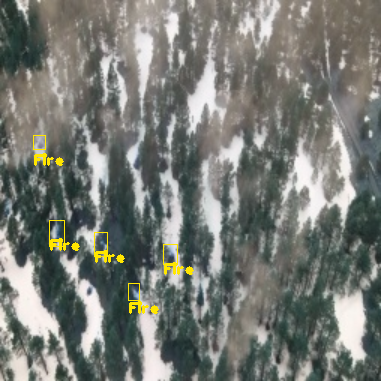

0
Confidence  0.99765605
Area of bounding box, ie. approx. area of fire 10880 pixels
[[0]]


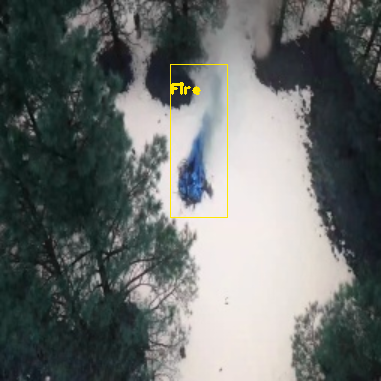

0
Confidence  0.8611808
Area of bounding box, ie. approx. area of fire 35075 pixels
0
Confidence  0.97906095
Area of bounding box, ie. approx. area of fire 11232 pixels
0
Confidence  0.96783936
Area of bounding box, ie. approx. area of fire 11040 pixels
0
Confidence  0.79780656
Area of bounding box, ie. approx. area of fire 12245 pixels
0
Confidence  0.6055518
Area of bounding box, ie. approx. area of fire 6360 pixels
0
Confidence  0.9594145
Area of bounding box, ie. approx. area of fire 28952 pixels
0
Confidence  0.9158174
Area of bounding box, ie. approx. area of fire 14271 pixels
0
Confidence  0.99341017
Area of bounding box, ie. approx. area of fire 69084 pixels
0
Confidence  0.8058251
Area of bounding box, ie. approx. area of fire 36153 pixels
[[7]
 [1]
 [2]
 [5]
 [6]
 [0]
 [3]
 [4]]


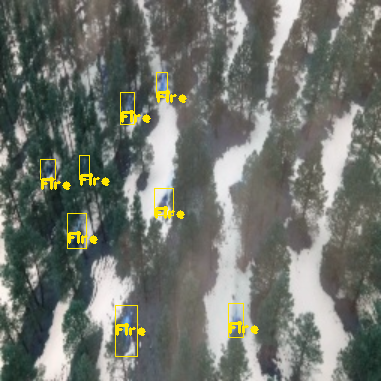

0
Confidence  0.98978275
Area of bounding box, ie. approx. area of fire 13846 pixels
0
Confidence  0.9706628
Area of bounding box, ie. approx. area of fire 26199 pixels
0
Confidence  0.97064286
Area of bounding box, ie. approx. area of fire 53106 pixels
0
Confidence  0.9599247
Area of bounding box, ie. approx. area of fire 32940 pixels
0
Confidence  0.98688984
Area of bounding box, ie. approx. area of fire 49728 pixels
0
Confidence  0.9735537
Area of bounding box, ie. approx. area of fire 80025 pixels
[[0]
 [4]
 [5]
 [1]
 [2]
 [3]]


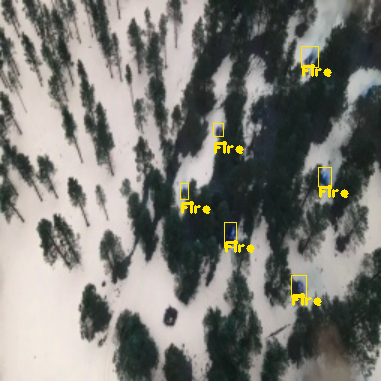

0
Confidence  0.79416376
Area of bounding box, ie. approx. area of fire 8476 pixels
0
Confidence  0.9053973
Area of bounding box, ie. approx. area of fire 7575 pixels
0
Confidence  0.96442527
Area of bounding box, ie. approx. area of fire 18984 pixels
0
Confidence  0.83425874
Area of bounding box, ie. approx. area of fire 35490 pixels
0
Confidence  0.93486154
Area of bounding box, ie. approx. area of fire 26554 pixels
0
Confidence  0.8981744
Area of bounding box, ie. approx. area of fire 27963 pixels
0
Confidence  0.8957477
Area of bounding box, ie. approx. area of fire 56500 pixels
0
Confidence  0.9890769
Area of bounding box, ie. approx. area of fire 47628 pixels
[[7]
 [2]
 [4]
 [1]
 [5]
 [6]
 [3]
 [0]]


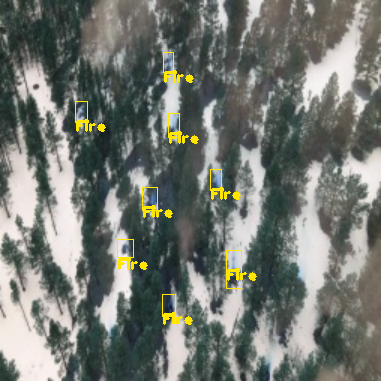

0
Confidence  0.9907116
Area of bounding box, ie. approx. area of fire 27784 pixels
[[0]]


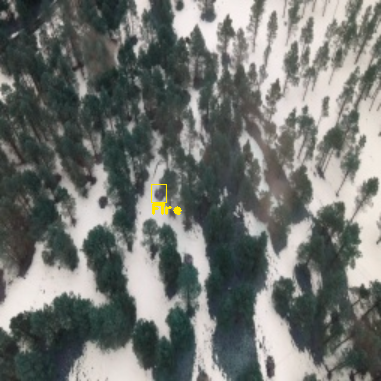

0
Confidence  0.9924631
Area of bounding box, ie. approx. area of fire 10908 pixels
0
Confidence  0.99547035
Area of bounding box, ie. approx. area of fire 36512 pixels
0
Confidence  0.98018557
Area of bounding box, ie. approx. area of fire 30030 pixels
0
Confidence  0.98520356
Area of bounding box, ie. approx. area of fire 57449 pixels
0
Confidence  0.99178475
Area of bounding box, ie. approx. area of fire 24969 pixels
[[1]
 [0]
 [4]
 [3]
 [2]]


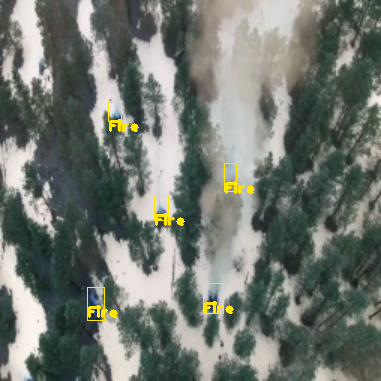

0
Confidence  0.9909774
Area of bounding box, ie. approx. area of fire 27633 pixels
[[0]]


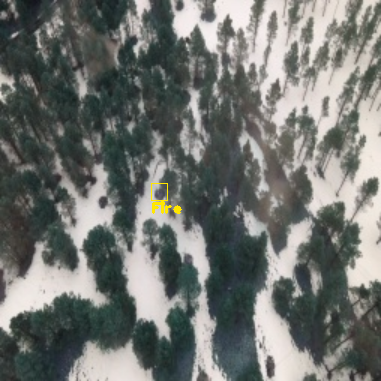

In [25]:
import cv2
import numpy as np
import glob
import random
from google.colab.patches import cv2_imshow
from IPython.display import Image
import IPython
import PIL.Image
# Load Yolo
net = cv2.dnn.readNet(r"/content/gdrive/MyDrive/yolov3/yolov3_training_2000.weights", r"/content/gdrive/MyDrive/yolov3/yolov3_testing.cfg")

# Name of the labelled object which is to be detected 
classes = ["Fire"]



# Images path
images_path = glob.glob(r"data/obj/*.jpg")


glob.glob("data/obj/*.jpg")


layer_names = net.getLayerNames()
output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
colors = np.random.uniform(0, 255, size=(len(classes), 3)) 


random.shuffle(images_path)

# loop through all the images
for img_path in images_path:
    # Loading image
    img = cv2.imread(img_path)
    img = cv2.resize(img, None, fx=1.5, fy=1.5)
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)

    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing informations on the screen
    class_ids = []
    confidences = []
    boxes = []
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.3:
                # Object detected
                print(class_id)
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)
                print("Confidence ", confidence)
                print("Area of bounding box, ie. approx. area of fire", x*y,"pixels")

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    print(indexes)
    font = cv2.FONT_HERSHEY_PLAIN
    # Blue color in BGR
    color = (255, 230, 0)
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            #color = colors[class_ids[i]]
            cv2.rectangle(img, (x, y), (x + w, y + h), color, 1)
            cv2.putText(img, label, (x, y + 30), font, 1, color, 2)
           
    
    IPython.display.display(PIL.Image.fromarray(img))